# Oral Diseases Classification using ResNet50V2

Oral Diseases Dataset: https://www.kaggle.com/datasets/salmansajid05/oral-diseases

---

## Import Libraries

In [1]:
import tensorflow as tf

print(tf.__version__)

2025-05-20 01:21:55.282183: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747704115.473273      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747704115.528192      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2.18.0


In [2]:
import os
import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
plt.style.use("seaborn-v0_8")

In [3]:
import warnings
warnings.filterwarnings('ignore')

---

## Preprocessing Dataset

In [4]:
!wget -O "dl_utils.py" "https://raw.githubusercontent.com/Raafat-Nagy/Deep-Learning-Projects/refs/heads/main/dl_utils/dl_utils.py"
from dl_utils import split_class


# Define original dataset directories
base_dir = "/kaggle/input"
original_dirs = {
    "Calculus": f"{base_dir}/oral-diseases/Calculus/Calculus",
    "Caries": f"{base_dir}/oral-diseases/Data caries/Data caries/caries augmented data set/preview",
    "Gingivitis": f"{base_dir}/oral-diseases/Gingivitis/Gingivitis",
    "Ulcers": f"{base_dir}/oral-diseases/Mouth Ulcer/Mouth Ulcer/Mouth_Ulcer_augmented_DataSet/preview",
    "Tooth-Discoloration": f"{base_dir}/oral-diseases/Tooth Discoloration/Tooth Discoloration /Tooth_discoloration_augmented_dataser/preview",
    "Hypodontia": f"{base_dir}/oral-diseases/hypodontia/hypodontia",
}


new_dataset_dir = "/kaggle/working/oral-diseases-dataset"

summary = []
for class_name, class_dir in original_dirs.items():
    class_details = split_class(
        class_dir,
        output_dir=new_dataset_dir,
        ratio=(0.7, 0.2, 0.1),
        class_name=class_name,
        seed=42,
    )
    summary.append(class_details)

--2025-05-20 01:22:08--  https://raw.githubusercontent.com/Raafat-Nagy/Deep-Learning-Projects/refs/heads/main/dl_utils/dl_utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8996 (8.8K) [text/plain]
Saving to: ‘dl_utils.py’

dl_utils.py         100%[===================>]   8.79K  --.-KB/s    in 0s      

2025-05-20 01:22:08 (76.2 MB/s) - ‘dl_utils.py’ saved [8996/8996]

Processing class 'Calculus' - Total images: 1296
  Train images: 907
  Val   images: 259
  Test  images: 130

Processing class 'Caries' - Total images: 2382
  Train images: 1667
  Val   images: 476
  Test  images: 239

Processing class 'Gingivitis' - Total images: 2349
  Train images: 1644
  Val   images: 469
  Test  images: 236

Processing class 'Ulcers' - Total images: 2541
  Train ima

In [5]:
dataset_dir = "/kaggle/working/oral-diseases-dataset"
print(os.listdir(dataset_dir))

['test', 'val', 'train']


In [6]:
train_dir = os.path.join(dataset_dir, "train")
test_dir = os.path.join(dataset_dir, "test")
val_dir = os.path.join(dataset_dir, "val")

In [7]:
summary = []

for root, dirs, files in os.walk(dataset_dir):
    if root and not dirs:
        split_path = root.split(os.sep)[-2:]
        if len(split_path) == 2:
            split, cls = split_path
            summary.append({"Split": split, "Class": cls, "Count": len(files)})

In [8]:
df = pd.DataFrame(summary)
data_summary = df.pivot(index="Class", columns="Split", values="Count")
data_summary

Split,test,train,val
Class,,,
Calculus,130,907,259
Caries,239,1667,476
Gingivitis,236,1644,469
Hypodontia,126,875,250
Tooth-Discoloration,185,1283,366
Ulcers,255,1778,508


---

## Visualize Data Distribution

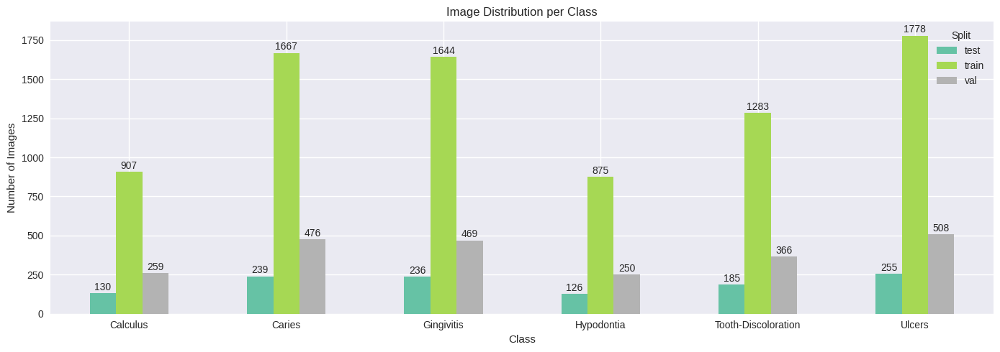

In [9]:
ax = data_summary.plot(kind="bar", figsize=(14, 5), colormap="Set2")
plt.title("Image Distribution per Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=0)
plt.legend(title="Split")

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height + 20, str(int(height)), ha="center")

plt.tight_layout()
plt.show()

---

## Load Data

In [10]:
# Define parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 128
INPUT_SHAPE = (*IMG_SIZE, 3)
SEED = 42

# Load datasets
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
)

Found 8154 files belonging to 6 classes.


I0000 00:00:1747704263.114697      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Found 2328 files belonging to 6 classes.
Found 1171 files belonging to 6 classes.


In [11]:
class_names = train_ds.class_names
num_classes = len(class_names)
print("class_names", class_names)
print("num_class", num_classes)

class_names ['Calculus', 'Caries', 'Gingivitis', 'Hypodontia', 'Tooth-Discoloration', 'Ulcers']
num_class 6


In [12]:
for image_batch, labels_batch in train_ds.take(1):
    print(image_batch.shape)
    print(labels_batch.shape)

(128, 224, 224, 3)
(128,)


---

## Visualize Random Images

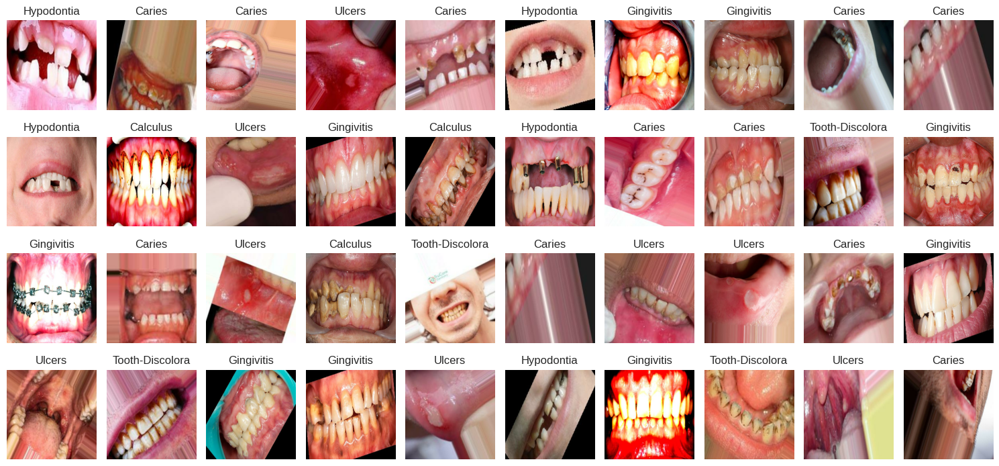

In [13]:
def plot_random_images(data, rows=4, cols=10, max_label_chars=15):
    """rows * cols must be less than or equal to the number of Batch samples (batch_size)."""

    plt.figure(figsize=(cols * 1.5, rows * 1.8))
    for images, labels in data.take(1):
        for i in range(rows * cols):
            plt.subplot(rows, cols, i + 1)
            plt.imshow(images[i] / 255)
            plt.title(class_names[labels[i]][:max_label_chars])
            plt.axis("off")
        plt.tight_layout()
        plt.show()


plot_random_images(train_ds)

---

## Data Augmentation

In [14]:
data_augmentation = tf.keras.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.2),
        tf.keras.layers.RandomZoom(0.2),
        tf.keras.layers.RandomContrast(0.1),
    ]
)

train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y))

### Visualize augmented images

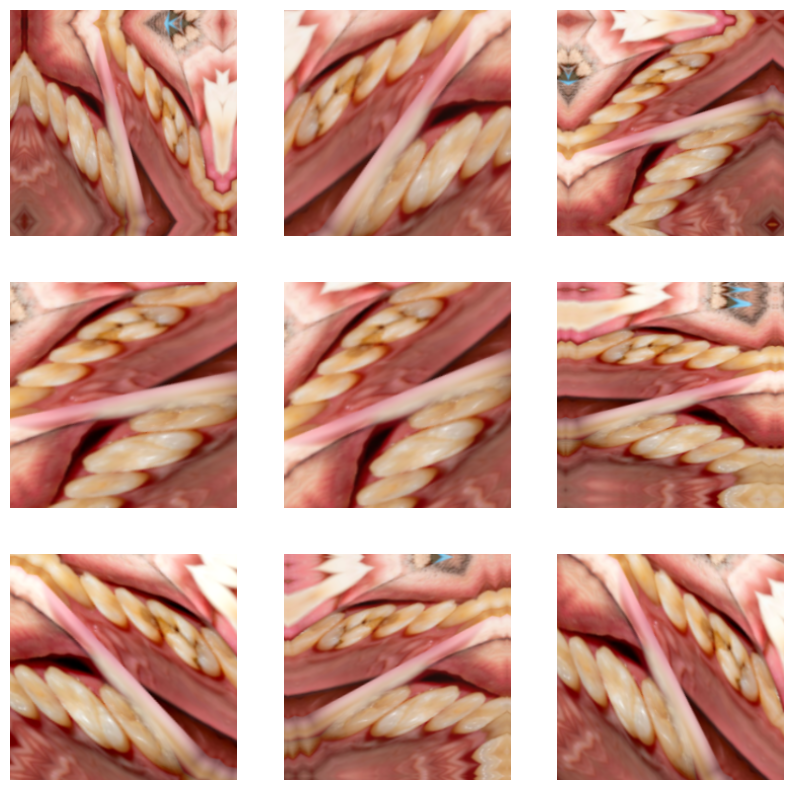

In [15]:
def plot_augmented_image(data):
    for image, _ in data.take(1):
        plt.figure(figsize=(10, 10))
        first_image = image[0]
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
            plt.imshow(augmented_image[0] / 255)
            plt.axis("off")
    plt.show()


plot_augmented_image(train_ds)

---

## Build the Model

### Load Pre-trained Base Model

In [16]:
from tensorflow.keras.applications import ResNet50V2

base_model = ResNet50V2(weights="imagenet", include_top=False, input_shape=INPUT_SHAPE)

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


### Fine-tuning

In [17]:
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  190


In [18]:
NUM_UNFROZEN_LAYERS = 25  # Number of layers to fine-tune

base_model.trainable = True
for layer in base_model.layers[:-NUM_UNFROZEN_LAYERS]:
    layer.trainable = False

In [19]:
# base_model.summary()

### Create Full Model

In [20]:
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet_v2 import preprocess_input


def build_model(base_model, input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    x = preprocess_input(inputs)
    x = base_model(x)

    # Classification head
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation="relu")(x)
    x = Dropout(0.5)(x)
    outputs = Dense(num_classes, activation="softmax")(x)
    
    return Model(inputs, outputs)


model = build_model(base_model, INPUT_SHAPE, num_classes)

In [21]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50v2 (Functional)              │ (None, 7, 7, 2048)          │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,827,846 (90.90 MB)

 Trainable params: 9,196,422 (35.08 MB)

 Non-trainable params: 14,631,424 (55.81 MB)

---

## Compile the Model

In [22]:
learning_rate = 1e-4
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
loss = tf.keras.losses.SparseCategoricalCrossentropy()
metrics = ["accuracy"]

model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

---

## Train the Model

In [23]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=8,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.75,
    patience=3,
    min_lr=1e-7,
    verbose=1
)

callbacks = [early_stopping, reduce_lr]

In [24]:
initial_epochs = 70
history = model.fit(
    train_ds, validation_data=val_ds, epochs=initial_epochs, callbacks=callbacks
)

Epoch 1/70


I0000 00:00:1747704297.640979      65 service.cc:148] XLA service 0x160c4810 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747704297.641956      65 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1747704299.249476      65 cuda_dnn.cc:529] Loaded cuDNN version 90300


 1/64 ━━━━━━━━━━━━━━━━━━━━ 30:52 29s/step - accuracy: 0.1797 - loss: 2.2351

I0000 00:00:1747704311.622081      65 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


64/64 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - accuracy: 0.3708 - loss: 1.6038 - val_accuracy: 0.7234 - val_loss: 0.7230 - learning_rate: 1.0000e-04
Epoch 2/70
64/64 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 0.7170 - loss: 0.7413 - val_accuracy: 0.8209 - val_loss: 0.4460 - learning_rate: 1.0000e-04
Epoch 3/70
64/64 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.8050 - loss: 0.5014 - val_accuracy: 0.8651 - val_loss: 0.3301 - learning_rate: 1.0000e-04
Epoch 4/70
64/64 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.8402 - loss: 0.4003 - val_accuracy: 0.8935 - val_loss: 0.2772 - learning_rate: 1.0000e-04
Epoch 5/70
64/64 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.8692 - loss: 0.3238 - val_accuracy: 0.8918 - val_loss: 0.2631 - learning_rate: 1.0000e-04
Epoch 6/70
64/64 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.8885 - loss: 0.2803 - val_accuracy: 0.9072 - val_loss: 0.2139 - learning_rate: 1.0000e-04
Epoch 7/70
64/64 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.9026 - loss: 0.2

---

## Plot Training History


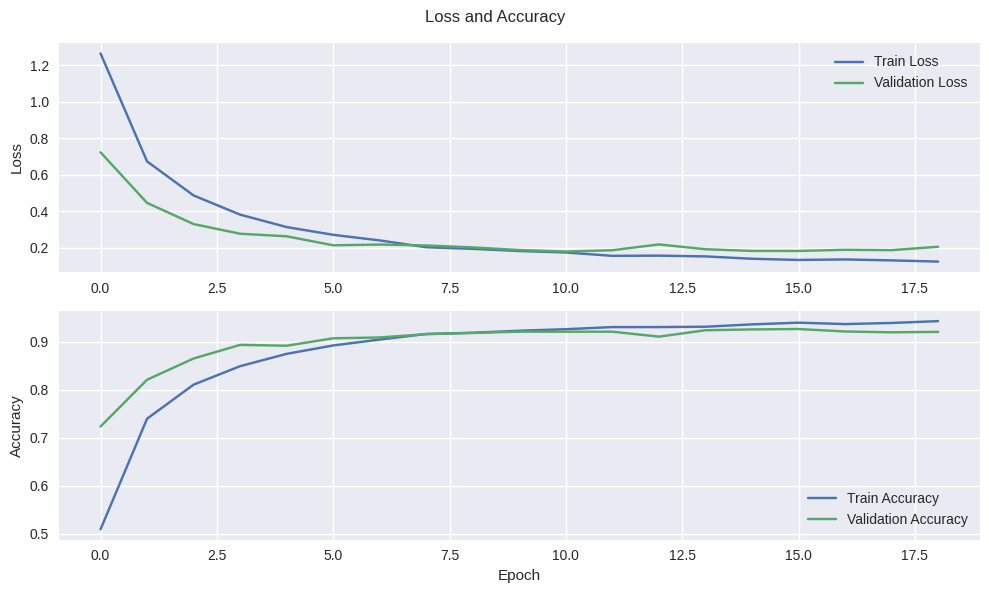

In [25]:
def plot_training_history(history):
    plt.figure(figsize=(10, 6))
    plt.suptitle("Loss and Accuracy")

    # Loss plot
    plt.subplot(2, 1, 1)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Validation Loss")
    plt.ylabel("Loss")
    plt.legend()

    # Accuracy plot
    plt.subplot(2, 1, 2)
    plt.plot(history.history["accuracy"], label="Train Accuracy")
    plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.xlabel("Epoch")
    plt.tight_layout()
    plt.show()


plot_training_history(history)

---

## Evaluate the Model

In [26]:
train_loss, train_accuracy = model.evaluate(train_ds)
print(f"Train Loss: {train_loss:.4f}")
print(f"Train Accuracy: {train_accuracy * 100:.2f}%")

64/64 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step - accuracy: 0.9346 - loss: 0.1375
Train Loss: 0.1334
Train Accuracy: 93.81%


In [27]:
val_loss, val_accuracy = model.evaluate(val_ds)
print(f"Val Loss: {val_loss:.4f}")
print(f"Val Accuracy: {val_accuracy * 100:.2f}%")

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - accuracy: 0.8696 - loss: 0.2887
Val Loss: 0.1797
Val Accuracy: 92.10%


In [28]:
test_loss, test_accuracy = model.evaluate(test_ds)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 467ms/step - accuracy: 0.8819 - loss: 0.2401
Test Loss: 0.1645
Test Accuracy: 91.97%


---

## Get true and predicted labels

In [29]:
true_labels = np.concatenate([labels.numpy() for _, labels in test_ds])

true_labels, true_labels.shape

(array([0, 0, 0, ..., 5, 5, 5], dtype=int32), (1171,))

In [30]:
predictions = model.predict(test_ds)
pred_labels = np.argmax(predictions, axis=1)

pred_labels, pred_labels.shape

10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 578ms/step


(array([0, 0, 2, ..., 5, 5, 5]), (1171,))

---

## Classification Report

In [31]:
from sklearn.metrics import classification_report

print(classification_report(true_labels, pred_labels, target_names=class_names))

                     precision    recall  f1-score   support

           Calculus       0.69      0.75      0.72       130
             Caries       0.98      0.97      0.98       239
         Gingivitis       0.84      0.83      0.84       236
         Hypodontia       0.96      0.97      0.96       126
Tooth-Discoloration       0.98      0.96      0.97       185
             Ulcers       1.00      0.99      0.99       255

           accuracy                           0.92      1171
          macro avg       0.91      0.91      0.91      1171
       weighted avg       0.92      0.92      0.92      1171



---

## Confusion Matrix

In [32]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

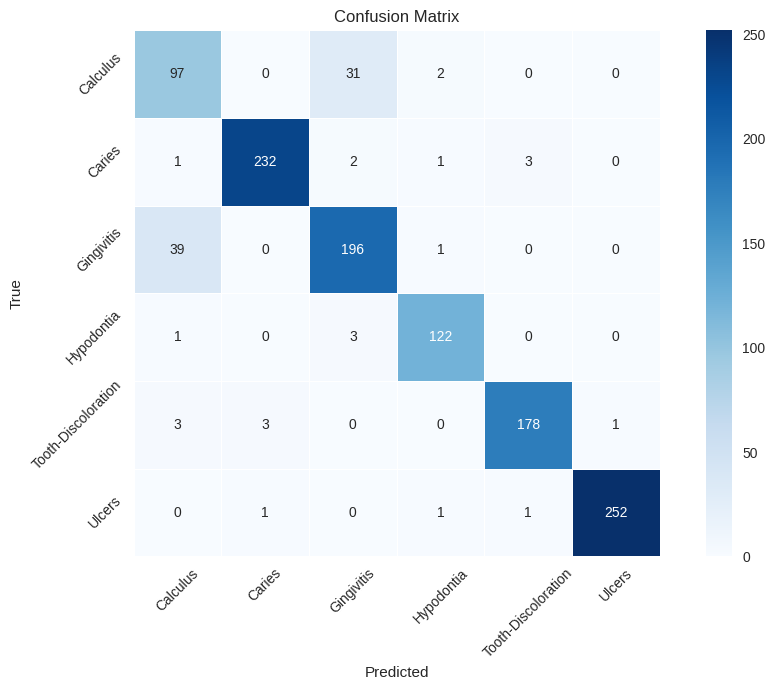

In [33]:
def plot_confusion_matrix(true_labels, pred_labels, class_names=None, rotation=45, figsize=(10, 7)):
    cm = confusion_matrix(true_labels, pred_labels)

    plt.figure(figsize=figsize)
    sns.heatmap(cm, 
                annot=True, 
                fmt="d", 
                cmap="Blues", 
                linewidths=0.5, 
                square=True,
                xticklabels=class_names, 
                yticklabels=class_names)

    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.xticks(rotation=rotation)
    plt.yticks(rotation=rotation)
    plt.tight_layout()
    plt.show()


plot_confusion_matrix(true_labels, pred_labels, class_names)

---

## Visualize Predictions

In [34]:
import matplotlib.pyplot as plt
import numpy as np

def plot_model_predictions(model, test_ds, class_names, rows=7, cols=8):
    """
    Plot model predictions on a batch of test images with customizable grid size.

    Parameters:
    - model: Trained Keras model
    - test_ds: A TensorFlow dataset (batched) for testing
    - class_names: List of class labels (in the same order as training)
    - rows: Number of rows in the plot grid
    - cols: Number of columns in the plot grid
    """
    total_images = rows * cols

    for images, labels in test_ds.take(1):
        preds = model.predict(images)
        pred_labels = np.argmax(preds, axis=1)

        plt.figure(figsize=(cols * 3, rows * 3))
        num_images = min(total_images, images.shape[0])

        for i in range(num_images):
            ax = plt.subplot(rows, cols, i + 1)
            plt.imshow(images[i] / 255.0)
            true_label = class_names[labels[i]]
            predicted_label = class_names[pred_labels[i]]
            color = "green" if true_label == predicted_label else "red"

            plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step


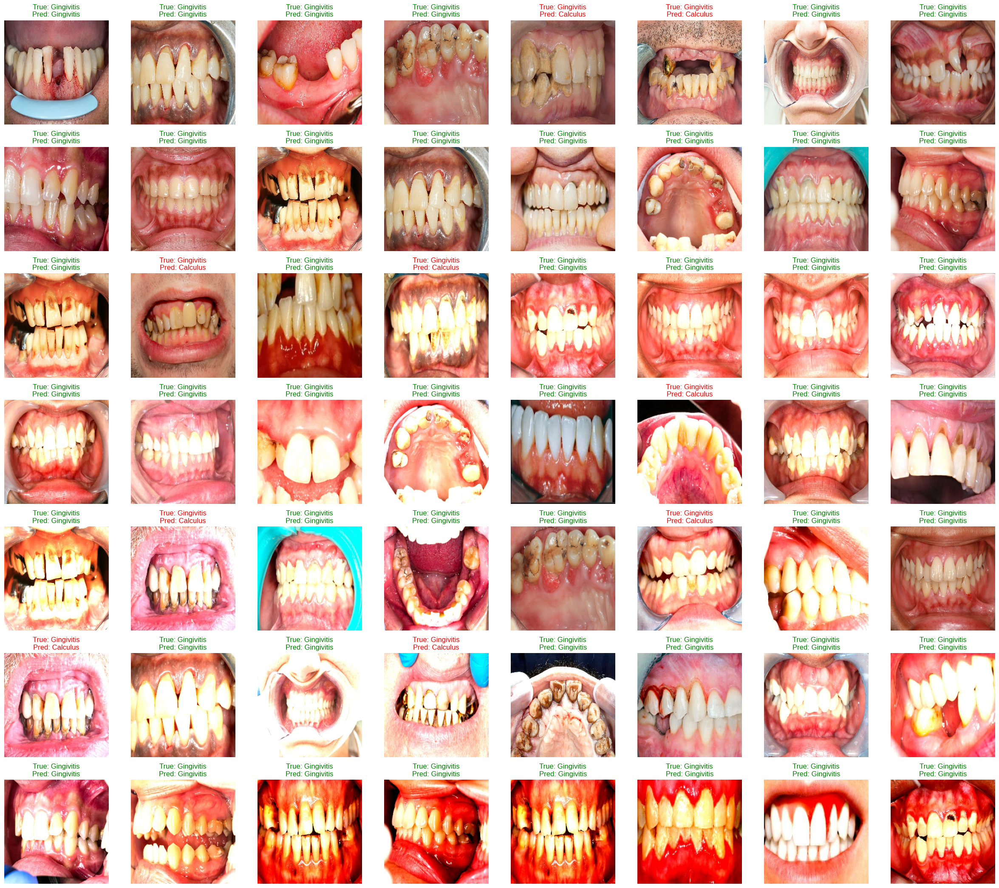

In [35]:
# Shuffle the test dataset
shuffled_test_ds = test_ds.shuffle(buffer_size=1000)

plot_model_predictions(model, shuffled_test_ds, class_names)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


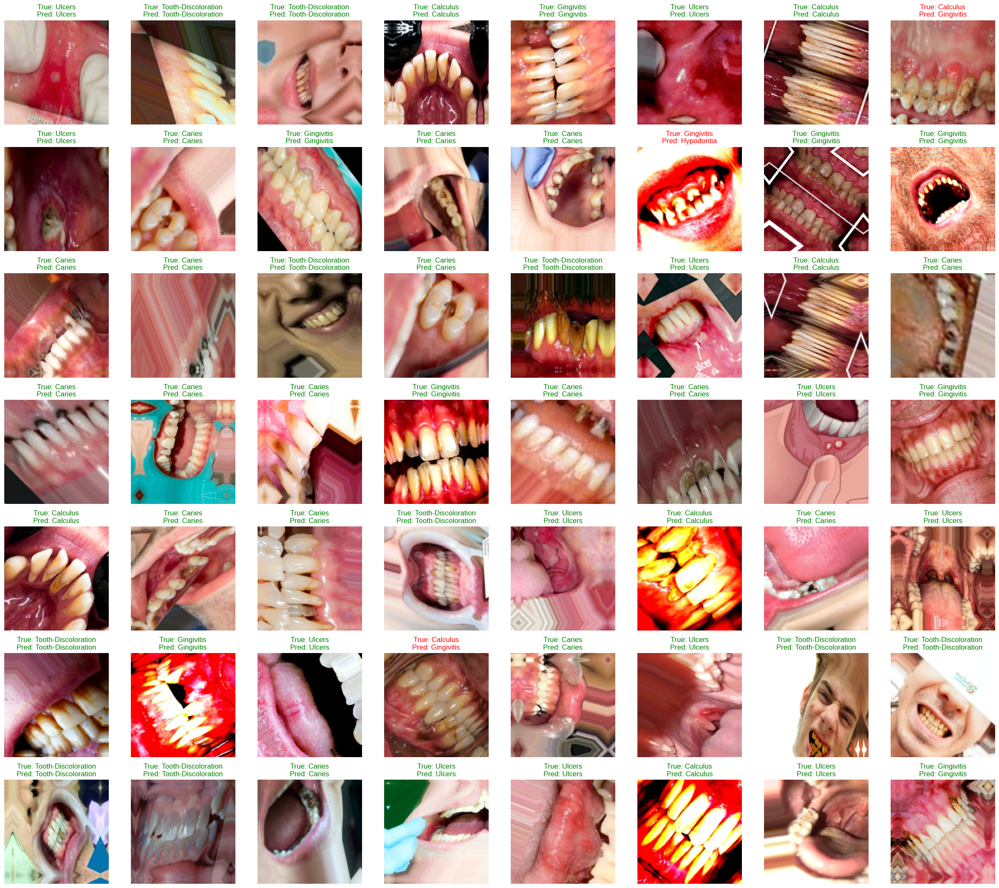

In [36]:
plot_model_predictions(model, train_ds, class_names)

---

## Save the Model

In [37]:
model.save("Oral_Diseases_Classification_model.keras")
print("Model Saved Successfully!")

Model Saved Successfully!


---
